# Surface chlorophyll comparison

I compare monthly model chlorophyll with GlobColour across the two runs.

Keep this notebook in the cluster's `GLOB` folder. Use the Julia kernel and run the cells in order.

- List `run_names` oldest first. Overlapping times use the later run with both ranks available, counted once.
- Model day 0 is 2000-01-01. Both runs use the same grid and time origin.
- Chlorophyll is in $\mathrm{mg\,Chl\,m^{-3}}$. Model `chl` already includes the Chl:N conversion of $1.31\ \mathrm{mg\,Chl\,(mmol\,N)^{-1}}$, so I read it directly.


In [1]:
using Dates, Pkg

# Settings
model_root = "/nfs/roberts/pi/pi_ey239/qi/global-ocean-model"
glob_root = "/nfs/roberts/pi/pi_ey239/qi/GLOB"
run_names = ["ice_glorys01_2_iron", "ice_glorys01_2_iron_2"]  # Oldest first.
day0 = DateTime(2000, 1, 1)
segment_files = [[joinpath(model_root, "output_ice", "surface_fields_$(name)_rank$(r).jld2")
                  for r in 0:1] for name in run_names]

satellite_root = joinpath(glob_root, "merged", "month")
satellite_product = "AV-SWF"   # Or "GSM-SWF" for a separate comparison.
satellite_resolution = "100"   # 1° mapped product.
satellite_files = String[]     # Optional file paths; same product and resolution.

max_distance_deg = 1.5
chl_limits = (0.01, 10.0)       # Display only.
log_ratio_limits = (-1.0, 1.0)
map_months_per_page = 4
scatter_axis_max = 100.0        # Same limit on both axes.
save_figures = true
figure_dir = joinpath(glob_root, "comparison_" * last(run_names) * "_merged_" * satellite_product)

isfile(joinpath(model_root, "Project.toml")) || error("Project.toml was not found in model_root; check the path.")
Pkg.activate(model_root)
using JLD2, Oceananigans, NCDatasets, CairoMakie, Statistics, Printf, Markdown
CairoMakie.activate!()
println("Julia ", VERSION, " | project: ", Base.active_project())


Julia 1.12.4 | project: /nfs/roberts/pi/pi_ey239/qi/global-ocean-model/Project.toml


## Helper functions

These cells read the files and define the plots. The default satellite product is 1° monthly `AV-SWF`. Set `satellite_product` to `GSM-SWF` for a separate comparison.


In [2]:
module ChlComparison

using Dates, Statistics, Printf, JLD2, Oceananigans
using Oceananigans.Architectures: CPU, on_architecture
using Oceananigans.Grids: inactive_cell

export model_catalog, monthly_means, nearest_mapping, remap,
       coordinate_edges, cell_weights, compare_fields, print_month_plan,
       read_record, write_catalog

const SECONDS_PER_DAY = 86400.0

function geometry(file, variable)
    p = "timeseries/$variable/serialized/grid_index"
    gp = haskey(file, p) ? "serialized/grid_$(file[p])" : "serialized/grid"
    haskey(file, gp) || error("Missing saved grid for $variable: $gp")
    grid = on_architecture(CPU(), file[gp])
    g = hasproperty(grid, :underlying_grid) ? grid.underlying_grid : grid
    all(n -> hasproperty(g, n), (:Nx, :Ny, :Nz, :λᶜᶜᵃ, :φᶜᶜᵃ)) ||
        error("Unsupported saved grid: $(typeof(g)); no fabricated coordinates are used.")
    nx, ny, nz = Int(g.Nx), Int(g.Ny), Int(g.Nz)
    lon = vec(Float64.(Array(g.λᶜᶜᵃ[1:nx, 1:ny])))
    lat = vec(Float64.(Array(g.φᶜᶜᵃ[1:nx, 1:ny])))
    all(isfinite, lon) && all(y -> isfinite(y) && -90 <= y <= 90, lat) ||
        error("Invalid saved center coordinates")
    location = file["timeseries/$variable/serialized/location"]
    all(l -> l === Center || l isa Center, location) ||
        error("Expected a center-located surface tracer, got $location")
    wet = vec([!inactive_cell(i, j, nz, grid) for i in 1:nx, j in 1:ny])
    return (; nx, ny, nz, lon=mod.(lon .+ 180, 360) .- 180, lat, wet)
end

function surface_values(file, variable, key, g)
    raw = Array(file["timeseries/$variable/$key"])
    if ndims(raw) == 3 && size(raw, 3) == 1
        raw = dropdims(raw; dims=3)
    end
    ndims(raw) == 2 || error("$variable must contain one saved surface layer; got $(size(raw))")
    dx, dy = size(raw, 1)-g.nx, size(raw, 2)-g.ny
    dx >= 0 && dy >= 0 && iseven(dx) && iseven(dy) || error("Incompatible saved halos")
    hx, hy = dx÷2, dy÷2
    inds = file["timeseries/$variable/serialized/indices"]
    for (ind, n, h) in zip(inds[1:2], (g.nx, g.ny), (hx, hy))
        ind isa Colon && continue
        ind isa AbstractUnitRange && first(ind) == 1-h && last(ind) == n+h ||
            error("Partial horizontal slices are not supported: $inds")
    end
    zind = inds[3]
    (zind == g.nz || (zind isa AbstractUnitRange && first(zind) == last(zind) == g.nz)) ||
        error("Saved $variable is not explicitly the top model layer: indices=$inds, Nz=$(g.nz)")
    return vec(Float64.(raw[hx+1:hx+g.nx, hy+1:hy+g.ny]))
end

function time_table(file)
    rows = [(time=Float64(file["timeseries/t/$k"]), key=String(k))
            for k in keys(file["timeseries/t"]) if tryparse(Int, String(k)) !== nothing]
    isempty(rows) && error("No saved model times")
    all(r -> isfinite(r.time) && r.time >= 0, rows) || error("Invalid model time")
    sort!(rows; by=r -> r.time)
    all(diff([r.time for r in rows]) .> 0) || error("Duplicate model times inside one file")
    return rows
end

function with_model_files(f, paths)
    files = Any[]
    try
        for p in paths
            push!(files, jldopen(p, "r"))
        end
        return f(files)
    finally
        foreach(close, files)
    end
end

same_geometry(a, b) = (a.nx, a.ny, a.nz) == (b.nx, b.ny, b.nz) &&
                       a.lon == b.lon && a.lat == b.lat && a.wet == b.wet

# Pair ranks within each run; keep the later complete record at overlapping times.
function model_catalog(input_paths; day0=DateTime(2000, 1, 1), tolerance=1.0,
                       variables=["chl"], segment_names=nothing,
                       first_day=0.0, last_day=nothing)
    isempty(input_paths) && error("No model files supplied")
    segments = all(p -> p isa AbstractString, input_paths) ? [collect(input_paths)] : collect.(input_paths)
    all(s -> length(s) == 2, segments) || error("Each segment needs exactly rank0 and rank1")
    paths = abspath.(String.(vcat(segments...)))
    length(unique(paths)) == length(paths) || error("Supply distinct ocean rank files, without repeating segments")
    all(isfile, paths) || error("Missing model file(s): $(join(filter(p -> !isfile(p), paths), ", "))")
    0 <= tolerance < 60 || error("Use a nonnegative time tolerance smaller than 60 seconds")
    first_day >= 0 || error("first_day must be nonnegative")
    isnothing(last_day) || last_day >= first_day || error("last_day precedes first_day")
    variables = unique(String.(collect(variables)))
    isempty(variables) && error("At least one required variable is needed")
    names = isnothing(segment_names) ? ["segment_$i" for i in eachindex(segments)] : String.(segment_names)
    length(names) == length(segments) && length(unique(names)) == length(names) || error("Segment names must be distinct and match file pairs")
    in_window(t) = t >= first_day*SECONDS_PER_DAY-tolerance &&
                   (isnothing(last_day) || t <= last_day*SECONDS_PER_DAY+tolerance)
    return with_model_files(paths) do files
        for (path, file) in zip(paths, files), variable in variables
            haskey(file, "timeseries/$variable") || error("Missing saved $variable in $path")
        end
        geoms = [geometry(files[i], first(variables)) for i in 1:2]
        for (index, file) in enumerate(files), variable in variables
            geo = geometry(file, variable)
            same_geometry(geo, geoms[mod1(index, 2)]) ||
                error("Grid/location/wet mask differs between segments or variables: $(paths[index]), $variable. Do not merge different grids.")
        end
        tables = time_table.(files)
        candidates, rejected, duplicates = NamedTuple[], String[], NamedTuple[]
        for segment in eachindex(segments)
            file_ids = (2segment-1, 2segment)
            table0, table1 = tables[file_ids[1]], tables[file_ids[2]]
            # Keep the original model times, including an off-midnight restart.
            used_second = Set{String}()
            accepted = 0
            for r0 in table0
                in_window(r0.time) || continue
                matches = findall(r -> abs(r.time-r0.time) <= tolerance, table1)
                length(matches) <= 1 || error("Ambiguous rank times in $(names[segment]) near day $(r0.time/SECONDS_PER_DAY)")
                if isempty(matches)
                    push!(rejected, "$(names[segment]) day $(r0.time/SECONDS_PER_DAY): no matching rank1 time")
                    continue
                end
                r1 = table1[only(matches)]
                r1.key in used_second && error("A rank1 record would be reused in $(names[segment])")
                rows = (r0, r1)
                if !all(haskey(files[file_ids[k]], "timeseries/$v/$(rows[k].key)") for k in 1:2, v in variables)
                    push!(rejected, "$(names[segment]) day $(r0.time/SECONDS_PER_DAY): incomplete required fields on one rank")
                    continue
                end
                # Stop if a saved array is incomplete.
                for k in 1:2, v in variables
                    surface_values(files[file_ids[k]], v, rows[k].key, geoms[k])
                end
                push!(used_second, r1.key)
                push!(candidates, (time=r0.time, times=(r0.time, r1.time), keys=(r0.key, r1.key),
                                   files=file_ids, segment, segment_name=names[segment],
                                   datetime=day0+Millisecond(round(Int, 1000*r0.time))))
                accepted += 1
            end
            for r1 in table1
                in_window(r1.time) && !(r1.key in used_second) &&
                    push!(rejected, "$(names[segment]) rank1 day $(r1.time/SECONDS_PER_DAY): no accepted paired record")
            end
            println(names[segment], ": ", accepted, " complete paired snapshots before deduplication")
        end
        isempty(candidates) && error("No complete paired snapshots in requested interval")
        sort!(candidates; by=r -> r.time)
        records = NamedTuple[]
        first_index = 1
        while first_index <= length(candidates)
            last_index = first_index
            anchor = candidates[first_index].time
            while last_index < length(candidates) && candidates[last_index+1].time-anchor <= tolerance
                last_index += 1
            end
            group = candidates[first_index:last_index]
            length(unique(r.segment for r in group)) == length(group) ||
                error("Two snapshots in the same segment fall within time tolerance near day $(anchor/SECONDS_PER_DAY)")
            winner = group[argmax(getproperty.(group, :segment))]
            push!(records, winner)
            for loser in group
                loser.segment == winner.segment && continue
                push!(duplicates, (time=winner.time, datetime=winner.datetime,
                                   kept=winner.segment_name, discarded=loser.segment_name,
                                   kept_keys=winner.keys, discarded_keys=loser.keys))
            end
            first_index = last_index+1
        end
        # All times in a duplicate group must be within tolerance.
        all(diff(getproperty.(records, :time)) .> tolerance) ||
            error("Ambiguous timestamp cluster; inspect saved times or reduce tolerance")
        println("Model source files (read-only):\n", join(paths, '\n'))
        println("Overlapping records removed: ", length(duplicates), "; later complete segment has priority")
        println("Retained snapshots: ", length(records), "; model day ", first(records).time/SECONDS_PER_DAY,
                "–", last(records).time/SECONDS_PER_DAY)
        println("Calendar coverage: ", first(records).datetime, " → ", last(records).datetime)
        for segment in eachindex(names)
            println("  Retained from ", names[segment], ": ", count(r -> r.segment == segment, records))
        end
        !isempty(rejected) && println("Excluded incomplete/unmatched records: ", length(rejected), "; first: ", first(rejected))
        return (; paths, segments=[paths[2i-1:2i] for i in eachindex(segments)], segment_names=names,
                 day0, tolerance, variables, geoms, records, rejected, duplicates,
                 lon=vcat([g.lon for g in geoms]...), lat=vcat([g.lat for g in geoms]...),
                 wet=vcat([g.wet for g in geoms]...))
    end
end

function read_record(files, catalog, record, variable)
    indices = hasproperty(record, :files) ? record.files : (1, 2)
    return vcat([surface_values(files[indices[k]], variable, record.keys[k], catalog.geoms[k]) for k in 1:2]...)
end

# Save file choices and skipped records.
function write_catalog(directory, catalog)
    mkpath(directory)
    quote_csv(x) = "\"" * replace(string(x), "\""=>"\"\"") * "\""
    open(joinpath(directory, "merged_snapshot_sources.csv"), "w") do io
        println(io, "model_day,datetime,segment,rank0_file,rank0_key,rank1_file,rank1_key")
        for r in catalog.records
            row = (r.time/SECONDS_PER_DAY, r.datetime, r.segment_name,
                   catalog.paths[r.files[1]], r.keys[1], catalog.paths[r.files[2]], r.keys[2])
            println(io, join(quote_csv.(row), ','))
        end
    end
    open(joinpath(directory, "merge_report.txt"), "w") do io
        println(io, "Priority, oldest to newest: ", join(catalog.segment_names, " -> "))
        println(io, "Required variables: ", join(catalog.variables, ", "))
        println(io, "Timestamp tolerance (seconds): ", catalog.tolerance)
        println(io, "Duplicate records removed: ", length(catalog.duplicates))
        for d in catalog.duplicates
            println(io, d.datetime, ": kept ", d.kept, "; discarded ", d.discarded)
        end
        println(io, "\nRejected records: ", length(catalog.rejected))
        foreach(r -> println(io, r), catalog.rejected)
    end
    return directory
end

function month_plan(catalog)
    first_month = Date(year(first(catalog.records).datetime), month(first(catalog.records).datetime), 1)
    last_month = Date(year(last(catalog.records).datetime), month(last(catalog.records).datetime), 1)
    plans = NamedTuple[]
    for m in first_month:Month(1):last_month
        expected = collect(DateTime(m):Day(1):DateTime(m+Month(1)))
        indices = Int[]
        missing_dates = DateTime[]
        for d in expected
            t = Dates.value(d-catalog.day0)/1000
            match = findall(r -> all(x -> abs(x-t) <= catalog.tolerance, r.times), catalog.records)
            length(match) > 1 && error("Ambiguous model snapshot near $d")
            isempty(match) ? push!(missing_dates, d) : push!(indices, only(match))
        end
        push!(plans, (; month=m, ndays=daysinmonth(m), indices, missing_dates, complete=isempty(missing_dates)))
    end
    return plans
end

function print_month_plan(catalog)
    plans = month_plan(catalog)
    for p in plans
        if p.complete
            println(p.month, ": complete; ", p.ndays, " days, ", length(p.indices), " instantaneous endpoints")
        else
            println(p.month, ": SKIP incomplete month; missing ", length(p.missing_dates),
                    " endpoints (first missing: ", first(p.missing_dates), ")")
        end
    end
    return plans
end

# Monthly means from daily snapshots, in mg Chl m⁻³.
function monthly_means(catalog; plans=month_plan(catalog))
    results = Dict{Date,Vector{Float64}}()
    return with_model_files(catalog.paths) do files
        for p in plans
            p.complete || continue
            accum = zeros(length(catalog.wet))
            for (n, idx) in enumerate(p.indices)
                r = catalog.records[idx]
                values = read_record(files, catalog, r, "chl")
                bad = catalog.wet .& .!isfinite.(values)
                any(bad) && error("Nonfinite model chl in wet cells at $(r.datetime): count=$(count(bad)); month not averaged")
                weight = (n == 1 || n == length(p.indices)) ? 0.5/p.ndays : 1.0/p.ndays
                accum[catalog.wet] .+= weight .* values[catalog.wet]
            end
            accum[.!catalog.wet] .= NaN
            results[p.month] = accum
            println("Model monthly mean ", p.month, ": wet min/max=", extrema(accum[catalog.wet]),
                    "; nonpositive wet cells=", count(x -> x <= 0, accum[catalog.wet]))
        end
        isempty(results) && error("No complete calendar month is available. Keep partial months out of a full-month comparison.")
        return results
    end
end

# Find the nearest cell before applying the ocean mask.
function nearest_mapping(lon, lat, targetlon, targetlat; radius=1.5)
    0 < radius <= 5 || error("Use a positive, explicitly chosen radius ≤ 5 degrees")
    xyz = (cosd.(lat).*cosd.(lon), cosd.(lat).*sind.(lon), sind.(lat))
    mapping = zeros(Int, length(targetlon), length(targetlat))
    distances = fill(NaN, size(mapping))
    Threads.@threads for j in eachindex(targetlat)
        y = targetlat[j]
        candidates = findall(v -> abs(v-y) <= radius, lat)
        for i in eachindex(targetlon)
            x = targetlon[i]
            tx, ty, tz = cosd(y)*cosd(x), cosd(y)*sind(x), sind(y)
            best, index = -Inf, 0
            for k in candidates
                dot = tx*xyz[1][k]+ty*xyz[2][k]+tz*xyz[3][k]
                if dot > best
                    best, index = dot, k
                end
            end
            distance = acosd(clamp(best, -1, 1))
            if index > 0 && distance <= radius
                mapping[i, j], distances[i, j] = index, distance
            end
        end
    end
    return (; mapping, distances)
end

function remap(values, mapping, wet)
    result = fill(NaN, size(mapping))
    for i in eachindex(mapping)
        k = mapping[i]
        if k > 0 && wet[k]
            result[i] = values[k]
        end
    end
    return result
end

function coordinate_edges(centers; latitude=false)
    length(centers) >= 2 && all(diff(centers) .> 0) || error("Coordinates must be increasing")
    edges = vcat(centers[1]-(centers[2]-centers[1])/2,
                 (centers[1:end-1] .+ centers[2:end])./2,
                 centers[end]+(centers[end]-centers[end-1])/2)
    latitude && (edges = clamp.(edges, -90.0, 90.0))
    return edges
end

# Relative cell areas from the longitude and latitude centers.
function cell_weights(lon, lat)
    le = coordinate_edges(lon)
    pe = coordinate_edges(lat; latitude=true)
    all(diff(le) .> 0) && all(diff(pe) .> 0) || error("Invalid inferred cell bounds")
    return deg2rad.(diff(le)) * transpose(diff(sind.(pe)))
end

function weighted_correlation(x, y, w)
    mx, my = sum(w.*x), sum(w.*y)
    dx, dy = x.-mx, y.-my
    vx, vy = sum(w.*dx.^2), sum(w.*dy.^2)
    return vx > 0 && vy > 0 ? sum(w.*dx.*dy)/sqrt(vx*vy) : NaN
end

function compare_fields(model, obs, weights; month)
    size(model) == size(obs) == size(weights) || error("Comparison grids disagree")
    valid = isfinite.(model) .& isfinite.(obs) .& (obs .> 0) .& (weights .> 0)
    any(valid) || error("No common valid ocean pixels in $month")
    x, y, w = model[valid], obs[valid], weights[valid]
    w ./= sum(w)
    mean_model, mean_sat = sum(w.*x), sum(w.*y)
    difference = x.-y
    positive = valid .& (model .> 0)
    log_rmse, log_bias, r_log10, geometric_ratio = NaN, NaN, NaN, NaN
    if any(positive)
        lx, ly, lw = log10.(model[positive]), log10.(obs[positive]), weights[positive]
        lw ./= sum(lw)
        log_bias = sum(lw.*(lx.-ly))
        log_rmse = sqrt(sum(lw.*(lx.-ly).^2))
        geometric_ratio = 10.0^log_bias
        r_log10 = weighted_correlation(lx, ly, lw)
    end
    obs_valid = isfinite.(obs) .& (obs .> 0)
    summary = (; month, n=count(valid), n_log=count(positive), n_model_nonpositive=count(valid .& (model .<= 0)),
               observation_area_covered=sum(weights[valid])/sum(weights[obs_valid]),
               mean_model, mean_sat, bias=sum(w.*difference), rmse=sqrt(sum(w.*difference.^2)),
               r_linear=weighted_correlation(x, y, w), log10_bias=log_bias, log10_rmse=log_rmse,
               r_log10, geometric_model_sat_ratio=geometric_ratio)
    return (; valid, positive, summary)
end

end


Main.ChlComparison

In [3]:
module GlobColourReader

using Dates
using NCDatasets

export discover_month_files, read_globcolour

# File format: https://hermes.acri.fr/images/GlobCOLOUR_PUG.pdf
# CF decoding: https://juliageo.org/NCDatasets.jl/stable/dataset/

attribute(object, name, default=nothing) = get(object.attrib, name, default)
astext(x) = strip(string(x))
allvalues(v) = v[ntuple(_ -> Colon(), ndims(v))...]

function parseday(x, context)
    s = astext(x)
    for (pattern, format) in ((r"^\d{8}$", dateformat"yyyymmdd"),
                              (r"^\d{4}-\d{2}-\d{2}$", dateformat"yyyy-mm-dd"))
        occursin(pattern, s) || continue
        result = tryparse(Date, s, format)
        isnothing(result) || Dates.format(result, format) == s && return result
    end
    error("Cannot read calendar date '$s' from $context; expected YYYYMMDD or YYYY-MM-DD.")
end

function filename_period(path)
    m = match(r"^L3m_(\d{8})-(\d{8})_.*_CHL1_MO_.*\.nc$"i, basename(path))
    isnothing(m) && return nothing
    return (parseday(m[1], path), parseday(m[2], path))
end

# Read resolution and product from the filename.
function filename_product(path)
    m = match(r"^L3m_\d{8}-\d{8}_+GLOB_([^_]+)_([^_]+)_CHL1_MO_[^/]+\.nc$"i, basename(path))
    isnothing(m) && return nothing
    return (resolution=uppercase(m[1]), product=uppercase(m[2]))
end

function matches_product(info; product=nothing, resolution=nothing)
    isnothing(info) && return isnothing(product) && isnothing(resolution)
    return (isnothing(product) || info.product == uppercase(product)) &&
           (isnothing(resolution) || info.resolution == uppercase(resolution))
end

function verify_product(ds, path; product=nothing, resolution=nothing)
    from_name = filename_product(path)
    metadata_name = attribute(ds, "product_name")
    from_metadata = isnothing(metadata_name) ? nothing : filename_product(astext(metadata_name))
    if !isnothing(from_name) && !isnothing(from_metadata)
        from_name == from_metadata || error("$path: filename and product_name identify different products.")
    end
    info = isnothing(from_name) ? from_metadata : from_name
    matches_product(info; product, resolution) ||
        error("$path: expected mapped GLOB_$(resolution) $(product) CHL1 monthly data; found $(info). For a renamed file, preserve a standard product_name attribute.")
    return info
end

function month_metadata(ds, path)
    start = attribute(ds, "period_start_day")
    stop = attribute(ds, "period_end_day")
    name_period = filename_period(path)
    product_name = attribute(ds, "product_name")
    product_period = isnothing(product_name) ? nothing : filename_period(astext(product_name))
    if xor(isnothing(start), isnothing(stop))
        error("$path: both period_start_day and period_end_day are required when either is present.")
    elseif !isnothing(start)
        interval = (parseday(start, "$path:period_start_day"), parseday(stop, "$path:period_end_day"))
        source = "period_start_day / period_end_day"
    elseif !isnothing(name_period)
        interval = name_period
        source = "standard GlobColour CHL1 monthly filename (period attributes absent)"
    elseif !isnothing(product_period)
        interval = product_period
        source = "standard GlobColour product_name (period attributes absent)"
    else
        error("$path: cannot establish the calendar month. Need period_start_day/end_day or a standard L3m_YYYYMMDD-YYYYMMDD_..._CHL1_MO_...nc name.")
    end
    first, last = interval
    first == firstdayofmonth(first) && last == lastdayofmonth(first) ||
        error("$path covers $first through $last, not one complete calendar month.")
    for (label, candidate) in (("filename", name_period), ("product_name", product_period))
        isnothing(candidate) || candidate == interval ||
            error("$path: $label dates $candidate disagree with the period metadata $interval.")
    end
    product_type = attribute(ds, "product_type")
    isnothing(product_type) || lowercase(astext(product_type)) in ("month", "monthly", "mo") ||
        error("$path is product_type=$(repr(product_type)), not a monthly product.")
    parameter = attribute(ds, "parameter_code")
    isnothing(parameter) || uppercase(astext(parameter)) == "CHL1" ||
        error("$path has parameter_code=$(repr(parameter)); this comparison expects CHL1.")
    return (month=first, period_start=first, period_end=last, date_source=source)
end

# Find monthly files for the selected product and resolution.
function discover_month_files(root, months; files_override=String[], product=nothing,
                              resolution=nothing, allow_missing=false)
    requested = sort!(unique(firstdayofmonth.(Date.(collect(months)))))
    isempty(requested) && return Dict{Date, String}()
    selected = Dict{Date, String}()
    for path in files_override
        isfile(path) || error("Explicit GlobColour file does not exist: $path")
        info = NCDataset(path, "r") do ds
            haskey(ds, "CHL1_mean") || error("$path has no CHL1_mean variable.")
            verify_product(ds, path; product, resolution)
            month_metadata(ds, path)
        end
        info.month in requested || continue
        haskey(selected, info.month) && error("Two explicit files were selected for $(info.month). Keep only one.")
        selected[info.month] = abspath(path)
    end
    remaining = setdiff(requested, collect(keys(selected)))
    isempty(remaining) && return selected
    isdir(root) || error("GlobColour directory does not exist: $root")
    # Search the requested years.
    year_paths = [joinpath(root, string(y)) for y in unique(year.(remaining))]
    search_roots = all(isdir, year_paths) ? year_paths : [root]
    candidates = Dict(m => String[] for m in remaining)
    for search_root in search_roots, (directory, _, files) in walkdir(search_root)
        for file in sort(files)
            occursin(r"^L3m_.*_CHL1_MO_.*\.nc$"i, file) || continue
            matches_product(filename_product(file); product, resolution) || continue
            path = joinpath(directory, file)
            period = filename_period(path)
            # Skip other months.
            !isnothing(period) && !(firstdayofmonth(period[1]) in remaining) && continue
            info = NCDataset(path, "r") do ds
                haskey(ds, "CHL1_mean") || error("$path has a CHL1 filename but no CHL1_mean variable.")
                verify_product(ds, path; product, resolution)
                month_metadata(ds, path)
            end
            info.month in remaining && push!(candidates[info.month], abspath(path))
        end
    end
    for month in remaining
        paths = unique(candidates[month])
        if isempty(paths)
            message = "No selected CHL1 monthly NetCDF for $month under $root (product=$product, resolution=$resolution)."
            allow_missing || error(message * " Use files_override if your files were renamed.")
            println("SKIP satellite month: ", message)
            continue
        end
        length(paths) == 1 || error("Multiple CHL1 files for $month. Select one in satellite_files (files_override); do not mix resolutions/algorithms:\n" * join(paths, "\n"))
        selected[month] = only(paths)
    end
    return selected
end

function coordinate(ds, names, expected_units, label, path)
    found = [name for name in names if haskey(ds, name)]
    length(found) == 1 || error("$path: expected exactly one $label coordinate among $names; found $found.")
    name = only(found)
    variable = ds[name]
    ndims(variable) == 1 || error("$path: $name must be a one-dimensional mapped-grid coordinate; binned/curvilinear products need another reader.")
    unit = lowercase(replace(astext(attribute(variable, "units", attribute(variable, "unit", ""))), " " => "_"))
    unit in expected_units || error("$path: cannot interpret $name units=$(repr(unit)) as angular $label coordinates.")
    values = Float64.(coalesce.(allvalues(variable), NaN))
    all(isfinite, values) || error("$path: $name contains missing/nonfinite coordinates.")
    length(values) > 1 || error("$path: $name needs at least two coordinates.")
    return (name=name, dimension=only(NCDatasets.dimnames(variable)), values=values)
end

function spatial_array(variable, lon_dimension, lat_dimension, path; raw=false)
    dimensions = NCDatasets.dimnames(variable)
    count(==(lon_dimension), dimensions) == 1 && count(==(lat_dimension), dimensions) == 1 ||
        error("$path: variable dimensions $dimensions do not identify one longitude and one latitude dimension.")
    indices = map(enumerate(dimensions)) do (i, dim)
        if dim in (lon_dimension, lat_dimension)
            Colon()
        else
            size(variable, i) == 1 || error("$path: extra dimension $dim has length $(size(variable, i)); expected one monthly map.")
            1
        end
    end
    values = (raw ? variable.var : variable)[indices...]
    kept = filter(dim -> dim in (lon_dimension, lat_dimension), dimensions)
    return first(kept) == lon_dimension ? Array(values) : permutedims(values, (2, 1))
end

flagbits(x::Integer) = UInt64(unsigned(x))

function flag_exclusions(ds, dimensions, path)
    name = "CHL1_flags"
    if !haskey(ds, name)
        @warn "CHL1_flags absent; using only CF missing values, valid ranges and positive CHL1" path
        return nothing, "CHL1_flags absent: no flag filtering was possible"
    end
    flags = ds[name]
    # Read raw flag bits; valid pixels can include sensor-source flags.
    raw = spatial_array(flags, dimensions..., path; raw=true)
    eltype(raw) <: Integer || error("$path: CHL1_flags must contain integer bit patterns.")
    any(k -> !isnothing(attribute(flags, k)), ("scale_factor", "add_offset")) &&
        error("$path: packed/scaled CHL1_flags are not supported; inspect their definition first.")
    meanings = attribute(flags, "flag_meanings")
    masks = attribute(flags, "flag_masks")
    names = ("no_measurement", "invalid", "land", "ice")
    rules = Tuple{UInt64, UInt64}[]
    if isnothing(meanings) && isnothing(masks)
        # Flag bits from PUG table 4-3, counted from zero.
        for bit in (0, 1, 3, 9)
            mask = UInt64(1) << bit
            push!(rules, (mask, mask))
        end
        source = "GlobColour PUG table 4-3: exclude NO_MEASUREMENT/INVALID/LAND/ICE (bits 0,1,3,9)"
    elseif isnothing(meanings) || isnothing(masks)
        error("$path: incomplete CHL1_flags metadata; need both flag_meanings and flag_masks.")
    else
        meaning_list = split(lowercase(astext(meanings)))
        mask_list = vec(collect(masks))
        length(meaning_list) == length(mask_list) || error("$path: flag_meanings/flag_masks lengths differ.")
        expected_values = attribute(flags, "flag_values")
        value_list = isnothing(expected_values) ? mask_list : vec(collect(expected_values))
        length(value_list) == length(mask_list) || error("$path: flag_values/flag_masks lengths differ.")
        for name in names
            i = findfirst(==(name), meaning_list)
            isnothing(i) && error("$path: CHL1_flags does not define '$name'; inspect flag_meanings before deciding a quality mask.")
            push!(rules, (flagbits(mask_list[i]), flagbits(value_list[i])))
        end
        source = "file flag_meanings/flag_masks: exclude NO_MEASUREMENT/INVALID/LAND/ICE"
    end
    excluded = map(raw) do value
        bits = flagbits(value)
        any(rule -> (bits & rule[1]) == rule[2], rules)
    end
    fill = attribute(flags, "_FillValue")
    # Zero is a valid flag value; exclude other missing-value markers.
    isnothing(fill) || fill == 0 || (excluded .|= raw .== fill)
    return excluded, source
end

# Read monthly chlorophyll in mg Chl m⁻³; mask invalid pixels.
function read_globcolour(path; variable="CHL1_mean")
    isfile(path) || error("GlobColour file does not exist: $path")
    return NCDataset(path, "r") do ds
        info = month_metadata(ds, path)
        haskey(ds, variable) || error("$path has no '$variable'. Variables: $(join(keys(ds), ", ")).")
        field = ds[variable]
        units = astext(attribute(field, "units", ""))
        compact_units = lowercase(replace(units, " " => "", "³" => "3", "⁻" => "-", "^" => "", "**" => "", "{" => "", "}" => ""))
        compact_units in ("mg/m3", "mgm-3") || error("$path: '$variable' units=$units; expected mg/m3. No automatic concentration conversion was applied.")
        lon = coordinate(ds, ("lon", "longitude"), ("degrees_east", "degree_east", "degrees_e", "degree_e"), "longitude", path)
        lat = coordinate(ds, ("lat", "latitude"), ("degrees_north", "degree_north", "degrees_n", "degree_n"), "latitude", path)
        all(x -> -90 <= x <= 90, lat.values) || error("$path: latitude outside [-90,90].")
        all(x -> -180 <= x <= 360, lon.values) || error("$path: longitude outside supported [-180,360] convention.")
        dimensions = (lon.dimension, lat.dimension)
        data = spatial_array(field, dimensions..., path)
        chl = Float64.(coalesce.(data, NaN))
        # Scaling is already decoded; valid ranges still apply to packed values.
        valid_range = attribute(field, "valid_range")
        valid_min = isnothing(valid_range) ? attribute(field, "valid_min", -Inf) : first(valid_range)
        valid_max = isnothing(valid_range) ? attribute(field, "valid_max", Inf) : last(valid_range)
        if isfinite(valid_min) || isfinite(valid_max)
            packed = spatial_array(field, dimensions..., path; raw=true)
            chl[(packed .< valid_min) .| (packed .> valid_max)] .= NaN
        end
        excluded, flag_policy = flag_exclusions(ds, dimensions, path)
        excluded_count = isnothing(excluded) ? 0 : count(excluded)
        isnothing(excluded) || (chl[excluded] .= NaN)
        nonpositive_count = count(x -> isfinite(x) && x <= 0, chl)
        chl[.!isfinite.(chl) .| (chl .<= 0)] .= NaN
        normalized_lon = mod.(lon.values .+ 180, 360) .- 180
        ix, iy = sortperm(normalized_lon), sortperm(lat.values)
        sorted_lon, sorted_lat = normalized_lon[ix], lat.values[iy]
        all(diff(sorted_lon) .> 0) && all(diff(sorted_lat) .> 0) || error("$path: duplicate coordinate values, including a possible repeated longitude seam.")
        metadata = merge(info, (
            variable=variable, original_units=units,
            parameter_code=attribute(ds, "parameter_code", "not supplied"),
            product_name=attribute(ds, "product_name", basename(path)),
            sensor=attribute(ds, "sensor", attribute(ds, "sensor_name", "not supplied")),
            flag_policy=flag_policy, flagged_count=excluded_count,
            nonpositive_count=nonpositive_count,
            fill_value=attribute(field, "_FillValue", nothing),
            scale_factor=attribute(field, "scale_factor", 1),
            add_offset=attribute(field, "add_offset", 0),
        ))
        return (month=info.month, lon=sorted_lon, lat=sorted_lat, chl=chl[ix, iy],
                units="mg/m3", metadata=metadata, path=abspath(path))
    end
end

end # module


Main.GlobColourReader

In [4]:
module ChlPlots

using CairoMakie, Dates, Printf
export monthly_map, monthly_maps, scatter_comparison, monthly_series

function monthly_map(result; concentration_limits=(0.01, 10.0), ratio_limits=(-1.0, 1.0))
    s, model, obs = result.satellite, result.model, result.satellite.chl
    concentration_limits[1] > 0 && concentration_limits[2] > concentration_limits[1] ||
        error("Concentration plot limits must be positive and increasing")
    model_log, sat_log, ratio = (fill(NaN, size(model)) for _ in 1:3)
    positive = result.comparison.positive
    valid = result.comparison.valid
    model_log[positive] .= log10.(model[positive])
    sat_log[valid] .= log10.(obs[valid])
    ratio[positive] .= log10.(model[positive]./obs[positive])
    fig = Figure(size=(1450, 420), fontsize=15)
    month_label = Dates.format(s.month, dateformat"yyyy-mm")
    Label(fig[1, 1:3], "Surface chlorophyll $month_label",
          fontsize=23)
    exponents = collect(ceil(log10(concentration_limits[1])):floor(log10(concentration_limits[2])))
    isempty(exponents) && (exponents = collect(log10.(concentration_limits)))
    ticks = (exponents, [@sprintf("%g", 10.0^e) for e in exponents])
    for (i, data, title) in ((1, model_log, "Model: monthly mean"),
                             (2, sat_log, "GlobColour: monthly CHL1"),
                             (3, ratio, "log10(Model / GlobColour)"))
        ax = Axis(fig[2, i], title=title, xlabel="Longitude", ylabel=i == 1 ? "Latitude" : "",
                  aspect=DataAspect(), backgroundcolor=:gray90,
                  xticks=-180:90:180, yticks=-90:45:90)
        limits!(ax, -180, 180, -90, 90)
        hm = heatmap!(ax, s.lon, s.lat, data; nan_color=:transparent,
                      colorrange=i == 3 ? ratio_limits : log10.(concentration_limits),
                      colormap=i == 3 ? :balance : :viridis)
        if i == 3
            Colorbar(fig[3, i], hm; vertical=false, width=Relative(0.78), height=10,
                     halign=:center, label="log10(Model / GlobColour)",
                     labelsize=13, ticklabelsize=13)
        else
            Colorbar(fig[3, i], hm; vertical=false, width=Relative(0.78), height=10,
                     halign=:center, ticks=ticks, label="Chlorophyll (mg m⁻³, log scale)",
                     labelsize=13, ticklabelsize=13)
        end
    end
    for i in 1:3
        colsize!(fig.layout, i, Relative(1/3))
    end
    # Keep the colorbars close to the maps.
    rowsize!(fig.layout, 2, Aspect(1, 0.5))
    rowgap!(fig.layout, 10)
    resize_to_layout!(fig)
    return fig
end

# One month per row, with shared colorbars.
function monthly_maps(results; concentration_limits=(0.01, 10.0), ratio_limits=(-1.0, 1.0))
    isempty(results) && error("No monthly results to plot")
    concentration_limits[1] > 0 && concentration_limits[2] > concentration_limits[1] ||
        error("Concentration plot limits must be positive and increasing")
    ordered = sort(collect(results); by=r -> r.satellite.month)
    nmonths = length(ordered)
    fig = Figure(size=(1450, 280nmonths + 150), fontsize=15)
    Label(fig[1, 2:4], "Surface chlorophyll monthly comparison", fontsize=23)
    exponents = collect(ceil(log10(concentration_limits[1])):floor(log10(concentration_limits[2])))
    isempty(exponents) && (exponents = collect(log10.(concentration_limits)))
    ticks = (exponents, [@sprintf("%g", 10.0^e) for e in exponents])
    for (m, result) in enumerate(ordered)
        s, model, obs = result.satellite, result.model, result.satellite.chl
        model_log, sat_log, ratio = (fill(NaN, size(model)) for _ in 1:3)
        positive, valid = result.comparison.positive, result.comparison.valid
        model_log[positive] .= log10.(model[positive])
        sat_log[valid] .= log10.(obs[valid])
        ratio[positive] .= log10.(model[positive]./obs[positive])
        row = m + 1
        Label(fig[row, 1], Dates.format(s.month, dateformat"yyyy-mm");
              fontsize=16, font=:bold, tellheight=false)
        for (i, data, title) in ((1, model_log, "Model: monthly mean"),
                                 (2, sat_log, "GlobColour: monthly CHL1"),
                                 (3, ratio, "log10(Model / GlobColour)"))
            column = i + 1
            ax = Axis(fig[row, column], title=m == 1 ? title : "",
                      xlabel="Longitude", ylabel=i == 1 ? "Latitude" : "",
                      aspect=DataAspect(), backgroundcolor=:gray90,
                      xticks=-180:90:180, yticks=-90:45:90)
            limits!(ax, -180, 180, -90, 90)
            m < nmonths && hidexdecorations!(ax; grid=false)
            i > 1 && hideydecorations!(ax; grid=false)
            hm = heatmap!(ax, s.lon, s.lat, data; nan_color=:transparent,
                          colorrange=i == 3 ? ratio_limits : log10.(concentration_limits),
                          colormap=i == 3 ? :balance : :viridis)
            if m == nmonths
                if i == 3
                    Colorbar(fig[nmonths + 2, column], hm; vertical=false,
                             width=Relative(0.78), height=10, halign=:center,
                             label="log10(Model / GlobColour)", labelsize=13, ticklabelsize=13)
                else
                    Colorbar(fig[nmonths + 2, column], hm; vertical=false,
                             width=Relative(0.78), height=10, halign=:center, ticks=ticks,
                             label="Chlorophyll (mg m⁻³, log scale)", labelsize=13, ticklabelsize=13)
                end
            end
        end
        rowsize!(fig.layout, row, Aspect(2, 0.5))
    end
    colsize!(fig.layout, 1, 85)
    for i in 2:4
        colsize!(fig.layout, i, Auto(1))
    end
    colgap!(fig.layout, 40)
    rowgap!(fig.layout, 18)
    resize_to_layout!(fig)
    return fig
end

const MONTH_COLORS = ["#0072B2", "#D55E00", "#009E73", "#CC79A7",
                      "#E69F00", "#56B4E9", "#6F4C9B", "#7F7F7F",
                      "#8C564B", "#BCBD22", "#17BECF", "#333333"]
const MONTH_MARKERS = [:circle, :utriangle, :rect, :diamond, :dtriangle, :pentagon]

# Use a separate style for each year and month.
function chronological_styles(results)
    dates = sort!(unique([r.satellite.month for r in results]))
    n = length(dates)
    colors = n <= length(MONTH_COLORS) ? MONTH_COLORS[1:n] : resample_cmap(:turbo, n)
    return Dict(d => (color=colors[i], marker=MONTH_MARKERS[mod1(i, length(MONTH_MARKERS))])
                for (i, d) in enumerate(dates))
end

# Combine months by default, with the legend inside and equal axis limits.
function scatter_comparison(results; split_months=false, y_max=100.0)
    isempty(results) && error("No monthly results to plot")
    results = sort(collect(results); by=r -> r.satellite.month)
    styles = chronological_styles(results)
    lower, upper = Inf, -Inf
    for r in results
        valid = r.comparison.positive
        any(valid) || continue
        x, y = r.satellite.chl[valid], r.model[valid]
        lower, upper = min(lower, minimum(x), minimum(y)), max(upper, maximum(x), maximum(y))
    end
    isfinite(lower) || error("No positive paired values for the log scatter plot")
    a, b = 10.0^floor(log10(lower)), 10.0^ceil(log10(upper))
    a == b && (a /= 10; b *= 10)
    y_upper = isnothing(y_max) ? b : Float64(y_max)
    isfinite(y_upper) && y_upper > a ||
        error("y_max must be finite and greater than the lower axis limit $a")
    b = y_upper  # Equal log-axis limits keep the 1:1 line corner-to-corner.
    if split_months
        columns = min(2, length(results))
        rows = cld(length(results), columns)
        fig = Figure(size=(500columns, 460rows + 45), fontsize=16)
        Label(fig[1, 1:columns], "Monthly comparison", fontsize=22)
        for (i, r) in enumerate(results)
            row, column = fld(i - 1, columns) + 2, mod1(i, columns)
            ax = Axis(fig[row, column],
                      title=Dates.format(r.satellite.month, dateformat"yyyy-mm"),
                      xlabel="GlobColour CHL1 (mg m⁻³)", ylabel="Model chlorophyll (mg m⁻³)",
                      xscale=log10, yscale=log10, aspect=1)
            valid = r.comparison.positive
            color = styles[r.satellite.month].color
            scatter!(ax, r.satellite.chl[valid], r.model[valid];
                     markersize=2.5, color=(color, 0.4))
            lines!(ax, [a, b], [a, b]; color=:black, linestyle=:dash, linewidth=1.2)
            limits!(ax, a, b, a, y_upper)
            any(valid) || text!(ax, sqrt(a*b), sqrt(a*b);
                               text="No positive pairs", align=(:center, :center))
        end
    else
        fig = Figure(size=(820, 730), fontsize=16)
        ax = Axis(fig[1, 1], xlabel="GlobColour CHL1 (mg m⁻³)", ylabel="Model chlorophyll (mg m⁻³)",
                  title="Monthly comparison", xscale=log10, yscale=log10, aspect=1)
        elements, labels = Any[], String[]
        for r in results
            valid = r.comparison.positive
            color = styles[r.satellite.month].color
            marker = styles[r.satellite.month].marker
            scatter!(ax, r.satellite.chl[valid], r.model[valid];
                     markersize=2.7, color=(color, 0.32), marker=marker)
            push!(elements, MarkerElement(color=color, marker=marker, markersize=13))
            push!(labels, Dates.format(r.satellite.month, dateformat"yyyy-mm"))
        end
        lines!(ax, [a, b], [a, b]; color=:black, linestyle=:dash, linewidth=1.2)
        limits!(ax, a, b, a, y_upper)
        push!(elements, LineElement(color=:black, linestyle=:dash, linewidth=1.2))
        push!(labels, "1:1")
        axislegend(ax, elements, labels; position=:rb, rowgap=4,
                   nbanks=cld(length(labels), 8),
                   patchsize=(22, 14), labelsize=12,
                   backgroundcolor=(:white, 0.95))
    end
    return fig
end

function monthly_series(results)
    isempty(results) && error("No monthly results to plot")
    rows = sort([r.comparison.summary for r in results]; by=r -> r.month)
    months = collect(first(rows).month:Month(1):last(rows).month)
    lookup = Dict(r.month => r for r in rows)
    # Leave gaps for missing months.
    model = [haskey(lookup, m) ? lookup[m].mean_model : NaN for m in months]
    satellite = [haskey(lookup, m) ? lookup[m].mean_sat : NaN for m in months]
    fig = Figure(size=(max(950, min(1500, 65length(months))), 470), fontsize=16)
    x = collect(eachindex(months))
    tick_indices = collect(1:max(1, cld(length(months), 18)):length(months))
    last(tick_indices) == length(months) || push!(tick_indices, length(months))
    ax = Axis(fig[1, 1], title="Monthly comparison",
              xlabel="Month", ylabel="Chlorophyll (mg m⁻³)",
              yautolimitmargin=(0.05, 0.30),
              xticklabelrotation=pi/4,
              xticks=(tick_indices, [Dates.format(months[i], dateformat"yyyy-mm") for i in tick_indices]))
    scatterlines!(ax, x, model; label="Model", linewidth=2)
    scatterlines!(ax, x, satellite; label="GlobColour", linewidth=2)
    axislegend(ax; position=:rt)
    return fig
end

end


Main.ChlPlots

In [5]:
# Merge the runs and remove overlapping times.
catalog = Base.invokelatest() do
    ChlComparison.model_catalog(segment_files; day0=day0, segment_names=run_names)
end
month_plans = Base.invokelatest() do
    ChlComparison.print_month_plan(catalog)
end
complete_months = [p.month for p in month_plans if p.complete]
isempty(complete_months) && error("No complete calendar month is available; check the missing daily endpoints above.")


ice_glorys01_2_iron: 142 complete paired snapshots before deduplication
ice_glorys01_2_iron_2: 292 complete paired snapshots before deduplication
Model source files (read-only):
/nfs/roberts/pi/pi_ey239/qi/global-ocean-model/output_ice/surface_fields_ice_glorys01_2_iron_rank0.jld2
/nfs/roberts/pi/pi_ey239/qi/global-ocean-model/output_ice/surface_fields_ice_glorys01_2_iron_rank1.jld2
/nfs/roberts/pi/pi_ey239/qi/global-ocean-model/output_ice/surface_fields_ice_glorys01_2_iron_2_rank0.jld2
/nfs/roberts/pi/pi_ey239/qi/global-ocean-model/output_ice/surface_fields_ice_glorys01_2_iron_2_rank1.jld2
Overlapping records removed: 5; later complete segment has priority
Retained snapshots: 429; model day 0.0–428.0
Calendar coverage: 2000-01-01T00:00:00 → 2001-03-04T00:00:00
  Retained from ice_glorys01_2_iron: 137
  Retained from ice_glorys01_2_iron_2: 292
2000-01-01: complete; 31 days, 32 instantaneous endpoints
2000-02-01: complete; 29 days, 30 instantaneous endpoints
2000-03-01: complete; 31 day

false

## 1. Select satellite files

I use one product and resolution throughout. Missing months are skipped. If a month has duplicate files, select one in `satellite_files`.

Missing, invalid, land and sea-ice pixels are excluded; sensor-source flags are retained. Units and dates are checked against the file metadata.


In [6]:
satellite_paths = Base.invokelatest() do
    GlobColourReader.discover_month_files(satellite_root, complete_months;
        files_override=satellite_files, product=satellite_product,
        resolution=satellite_resolution, allow_missing=true)
end
comparison_months = sort!(collect(keys(satellite_paths)))
missing_satellite_months = setdiff(complete_months, comparison_months)
println("Available comparison months: ", join(string.(comparison_months), ", "))
println("Missing satellite months: ", isempty(missing_satellite_months) ? "none" : join(string.(missing_satellite_months), ", "))
isempty(comparison_months) && error("No matching satellite months. Check satellite_root / satellite_product or download the missing product.")
satellite_maps = Base.invokelatest() do
    Dict(m => GlobColourReader.read_globcolour(satellite_paths[m]) for m in comparison_months)
end
for m in comparison_months
    s = satellite_maps[m]
    println("\n", m, " | ", s.path)
    println("Grid: ", size(s.chl), " | file units: ", s.metadata.original_units,
            " | median grid spacing (lon, lat): ", (median(diff(s.lon)), median(diff(s.lat))))
    println("Product: ", s.metadata.product_name)
    println("Mask: ", s.metadata.flag_policy)
    println("Valid positive cells: ", count(isfinite, s.chl), " / ", length(s.chl))
    length(s.chl) <= 1_000_000 || error("More than one million cells; check the intended satellite resolution.")
end


Available comparison months: 2000-01-01, 2000-02-01, 2000-03-01, 2000-04-01, 2000-05-01, 2000-06-01, 2000-07-01, 2000-08-01, 2000-09-01, 2000-10-01, 2000-11-01, 2000-12-01, 2001-01-01, 2001-02-01
Missing satellite months: none

2000-01-01 | /nfs/roberts/pi/pi_ey239/qi/GLOB/merged/month/2000/01/01/L3m_20000101-20000131__GLOB_100_AV-SWF_CHL1_MO_00.nc
Grid: (360, 180) | file units: mg/m3 | median grid spacing (lon, lat): (1.0, 1.0)
Product: L3m_20000101-20000131__GLOB_100_AV-SWF_CHL1_MO_00.nc
Mask: file flag_meanings/flag_masks: exclude NO_MEASUREMENT/INVALID/LAND/ICE
Valid positive cells: 32411 / 64800

2000-02-01 | /nfs/roberts/pi/pi_ey239/qi/GLOB/merged/month/2000/02/01/L3m_20000201-20000229__GLOB_100_AV-SWF_CHL1_MO_00.nc
Grid: (360, 180) | file units: mg/m3 | median grid spacing (lon, lat): (1.0, 1.0)
Product: L3m_20000201-20000229__GLOB_100_AV-SWF_CHL1_MO_00.nc
Mask: file flag_meanings/flag_masks: exclude NO_MEASUREMENT/INVALID/LAND/ICE
Valid positive cells: 33676 / 64800

2000-03-01

## 2. Monthly means and statistics

Model monthly means use trapezoidal integration of daily snapshots, including the next month's first day. Incomplete months are skipped.

I match the nearest model cell to each satellite cell within `max_distance_deg`, then exclude land and missing values. Means and statistics are area weighted over cells valid in both datasets.

Bias is model minus satellite. Linear statistics include zero and negative model values; log statistics use positive pairs only. Chlorophyll, bias and linear RMSE are in $\mathrm{mg\,Chl\,m^{-3}}$.


In [7]:
# Compare months available in both datasets.
comparison_plans = [p for p in month_plans if p.complete && p.month in comparison_months]
model_months, mapping, weights, results = Base.invokelatest() do
    reference = satellite_maps[first(comparison_months)]
    for m in comparison_months
        s = satellite_maps[m]
        s.lon == reference.lon && s.lat == reference.lat && s.units == reference.units ||
            error("Satellite grid or units differ between months. Select one consistent product/resolution.")
    end
    means = ChlComparison.monthly_means(catalog; plans=comparison_plans)
    mapping = ChlComparison.nearest_mapping(catalog.lon, catalog.lat,
                reference.lon, reference.lat; radius=max_distance_deg)
    distances = filter(isfinite, vec(mapping.distances))
    isempty(distances) && error("No model centers are within the allowed matching distance.")
    println("Matched center distance (degrees), median / p95 / max: ",
            (median(distances), quantile(distances, 0.95), maximum(distances)))
    weights = ChlComparison.cell_weights(reference.lon, reference.lat)
    results = map(comparison_months) do m
        satellite = satellite_maps[m]
        model = ChlComparison.remap(means[m], mapping.mapping, catalog.wet)
        comparison = ChlComparison.compare_fields(model, satellite.chl, weights; month=m)
        (; satellite, model, comparison)
    end
    (means, mapping, weights, results)
end
summary_rows = [r.comparison.summary for r in results]


Model monthly mean 2000-01-01: wet min/max=(0.0, 3.485286859840516); nonpositive wet cells=53
Model monthly mean 2000-02-01: wet min/max=(0.0, 2.7346797770467295); nonpositive wet cells=53
Model monthly mean 2000-03-01: wet min/max=(0.0, 2.95625896992222); nonpositive wet cells=53
Model monthly mean 2000-04-01: wet min/max=(0.0, 3.1570339878400167); nonpositive wet cells=53
Model monthly mean 2000-05-01: wet min/max=(0.0, 3.9980663945597996); nonpositive wet cells=53
Model monthly mean 2000-06-01: wet min/max=(0.0, 4.713630549112955); nonpositive wet cells=53
Model monthly mean 2000-07-01: wet min/max=(0.0, 3.764672798495138); nonpositive wet cells=53
Model monthly mean 2000-08-01: wet min/max=(0.0, 3.0317682527726695); nonpositive wet cells=53
Model monthly mean 2000-09-01: wet min/max=(0.0, 1.5810805847247442); nonpositive wet cells=53
Model monthly mean 2000-10-01: wet min/max=(0.0, 1.903820666574663); nonpositive wet cells=53
Model monthly mean 2000-11-01: wet min/max=(0.0, 2.88788

14-element Vector{@NamedTuple{month::Date, n::Int64, n_log::Int64, n_model_nonpositive::Int64, observation_area_covered::Float64, mean_model::Float64, mean_sat::Float64, bias::Float64, rmse::Float64, r_linear::Float64, log10_bias::Float64, log10_rmse::Float64, r_log10::Float64, geometric_model_sat_ratio::Float64}}:
 (month = Date("2000-01-01"), n = 31695, n_log = 31694, n_model_nonpositive = 1, observation_area_covered = 0.9765713322904819, mean_model = 0.12515868693789794, mean_sat = 0.22098756523049046, bias = -0.09582887829259253, rmse = 0.47646715403888507, r_linear = 0.2109299122762771, log10_bias = -0.4270425634723506, log10_rmse = 0.6119005010346189, r_log10 = 0.5343830205114147, geometric_model_sat_ratio = 0.3740739249800425)
 (month = Date("2000-02-01"), n = 32893, n_log = 32892, n_model_nonpositive = 1, observation_area_covered = 0.975961447963227, mean_model = 0.5002568225914046, mean_sat = 0.22263747234984405, bias = 0.2776193502415606, rmse = 0.632979960615234, r_linear = 

In [8]:
table = "| Month | Common cells | Satellite area covered | Model mean | Satellite mean | Bias | RMSE | log10 RMSE | Geometric model/sat ratio | Model ≤ 0 |\n" *
        "|:--|--:|--:|--:|--:|--:|--:|--:|--:|--:|\n"
for r in summary_rows
    global table *= @sprintf("| %s | %d | %.1f%% | %.4g | %.4g | %+.4g | %.4g | %.4g | %.4g | %d |\n",
        string(r.month), r.n, 100*r.observation_area_covered, r.mean_model, r.mean_sat,
        r.bias, r.rmse, r.log10_rmse, r.geometric_model_sat_ratio, r.n_model_nonpositive)
end
display(Markdown.parse(table))
println("Mean, bias and linear RMSE units: mg/m³. Log10 RMSE is dimensionless.")
println("Geometric ratio = 10^(area-weighted mean log10(model/satellite)); it is not the ratio of the two arithmetic means.")
for r in summary_rows
    println(r.month, " | linear N=", r.n, " | positive/log N=", r.n_log,
            " | weighted r (linear, log10)=", (r.r_linear, r.r_log10))
end


| Month      | Common cells | Satellite area covered | Model mean | Satellite mean |     Bias |   RMSE | log10 RMSE | Geometric model/sat ratio | Model ≤ 0 |
|:---------- | ------------:| ----------------------:| ----------:| --------------:| --------:| ------:| ----------:| -------------------------:| ---------:|
| 2000-01-01 |        31695 |                  97.7% |     0.1252 |          0.221 | -0.09583 | 0.4765 |     0.6119 |                    0.3741 |         1 |
| 2000-02-01 |        32893 |                  97.6% |     0.5003 |         0.2226 |  +0.2776 |  0.633 |     0.5859 |                     2.025 |         1 |
| 2000-03-01 |        33131 |                  97.5% |     0.7151 |         0.2171 |  +0.4979 | 0.7441 |     0.7573 |                     4.165 |         1 |
| 2000-04-01 |        31854 |                  97.4% |     0.7486 |         0.2311 |  +0.5175 | 0.7905 |     0.7897 |                     4.915 |         1 |
| 2000-05-01 |        28787 |                  97.2% |     0.7804 |         0.2704 |  +0.5101 | 0.8823 |     0.7845 |                     4.899 |         1 |
| 2000-06-01 |        26627 |                  96.9% |     0.7113 |         0.2532 |  +0.4581 | 0.6829 |      0.744 |                     4.511 |         1 |
| 2000-07-01 |        28145 |                  96.9% |     0.6859 |         0.2459 |    +0.44 | 0.7131 |     0.7306 |                     4.396 |         1 |
| 2000-08-01 |        32083 |                  96.9% |     0.6853 |         0.2555 |  +0.4298 | 0.7187 |      0.735 |                      4.34 |         1 |
| 2000-09-01 |        32144 |                  97.0% |     0.7348 |         0.2563 |  +0.4785 | 0.7305 |     0.7751 |                     4.777 |         1 |
| 2000-10-01 |        31021 |                  97.1% |     0.7735 |         0.2297 |  +0.5438 | 0.7276 |      0.816 |                     5.351 |         1 |
| 2000-11-01 |        30068 |                  97.5% |     0.7964 |         0.2114 |   +0.585 | 0.7447 |     0.8534 |                     5.873 |         1 |
| 2000-12-01 |        29714 |                  97.6% |     0.7608 |         0.2129 |   +0.548 | 0.6904 |     0.8308 |                      5.53 |         1 |
| 2001-01-01 |        31581 |                  97.6% |     0.7415 |         0.2114 |  +0.5301 | 0.6868 |     0.8216 |                     5.399 |         1 |
| 2001-02-01 |        32761 |                  97.6% |     0.7341 |         0.2185 |  +0.5155 | 0.6795 |      0.816 |                     5.289 |         0 |


Mean, bias and linear RMSE units: mg/m³. Log10 RMSE is dimensionless.
Geometric ratio = 10^(area-weighted mean log10(model/satellite)); it is not the ratio of the two arithmetic means.
2000-01-01 | linear N=31695 | positive/log N=31694 | weighted r (linear, log10)=(0.2109299122762771, 0.5343830205114147)
2000-02-01 | linear N=32893 | positive/log N=32892 | weighted r (linear, log10)=(0.214699094451358, 0.449115171640476)
2000-03-01 | linear N=33131 | positive/log N=33130 | weighted r (linear, log10)=(0.14806506093496782, 0.33889701257447385)
2000-04-01 | linear N=31854 | positive/log N=31853 | weighted r (linear, log10)=(0.17156535956800734, 0.35854668275095963)
2000-05-01 | linear N=28787 | positive/log N=28786 | weighted r (linear, log10)=(0.2793676441803602, 0.4339274958848802)
2000-06-01 | linear N=26627 | positive/log N=26626 | weighted r (linear, log10)=(0.34186415780033286, 0.44436904023186047)
2000-07-01 | linear N=28145 | positive/log N=28144 | weighted r (linear, log10)=(0.24

## 3. Monthly maps

Four months per page, with the same color scale throughout. The last column shows $\log_{10}(\mathrm{model}/\mathrm{GlobColour})$; gray means no comparison. Color limits affect display only.

For plot changes, update the display settings and rerun the plotting cells. The existing `results` can be reused.


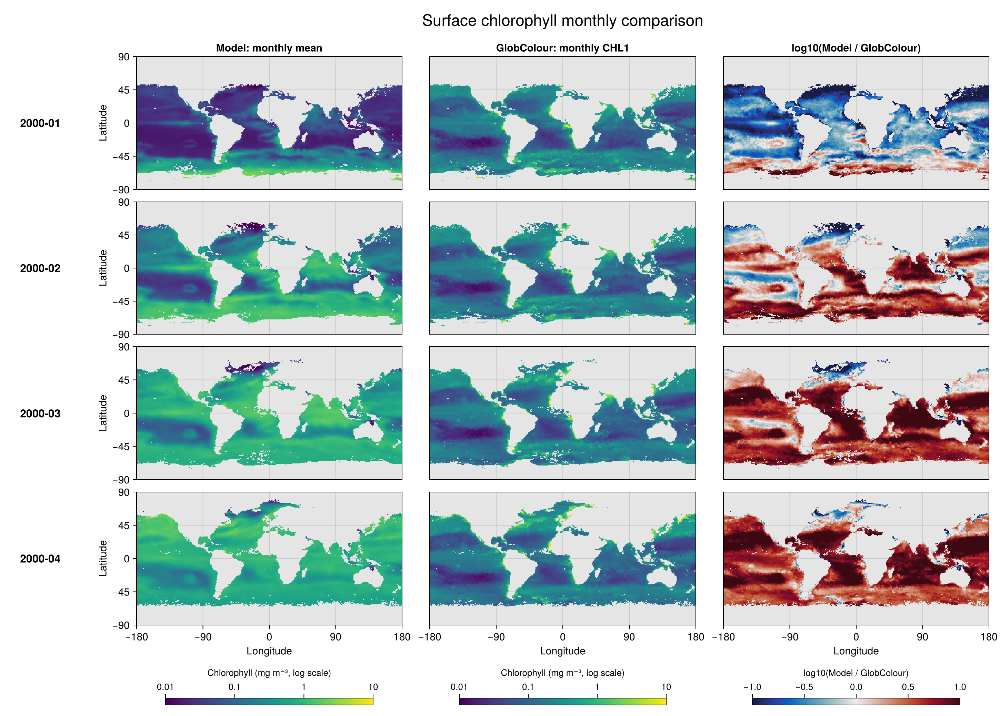

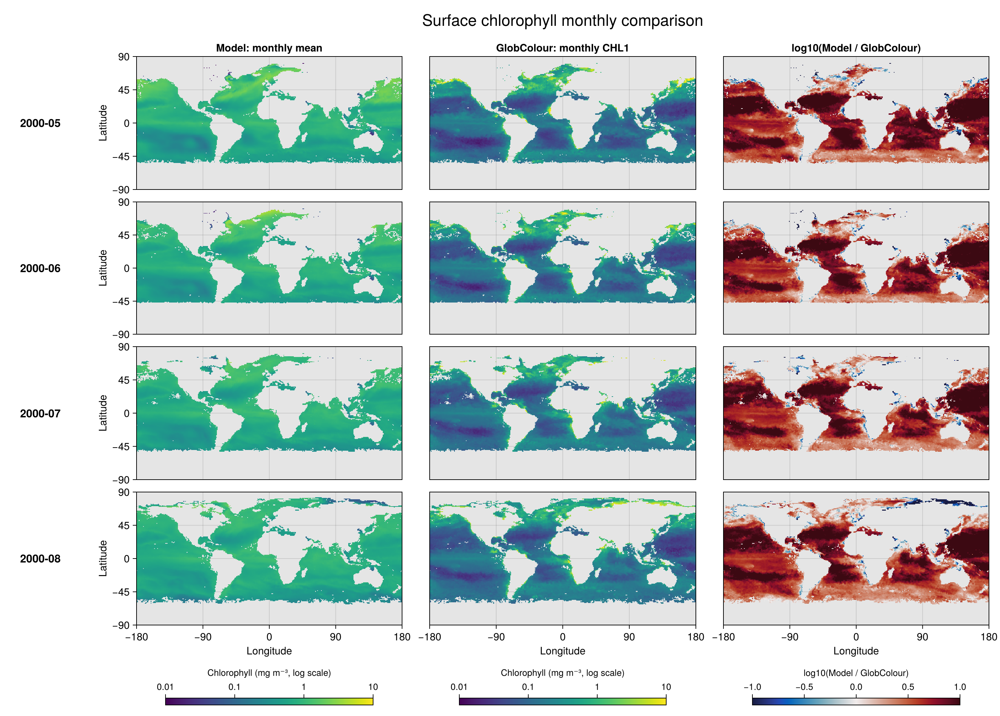

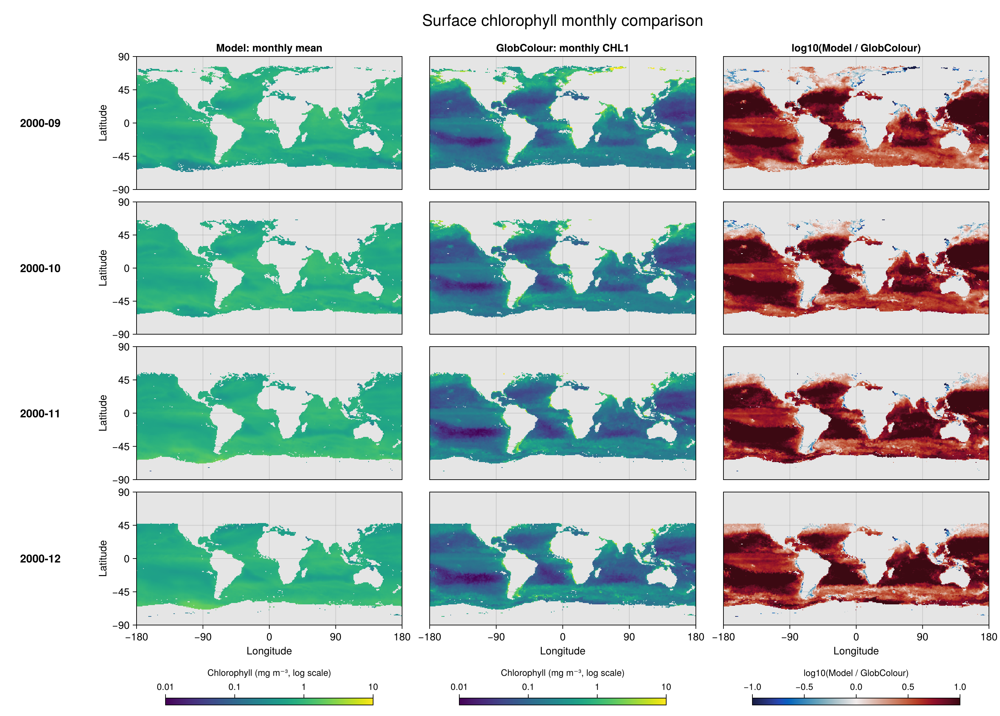

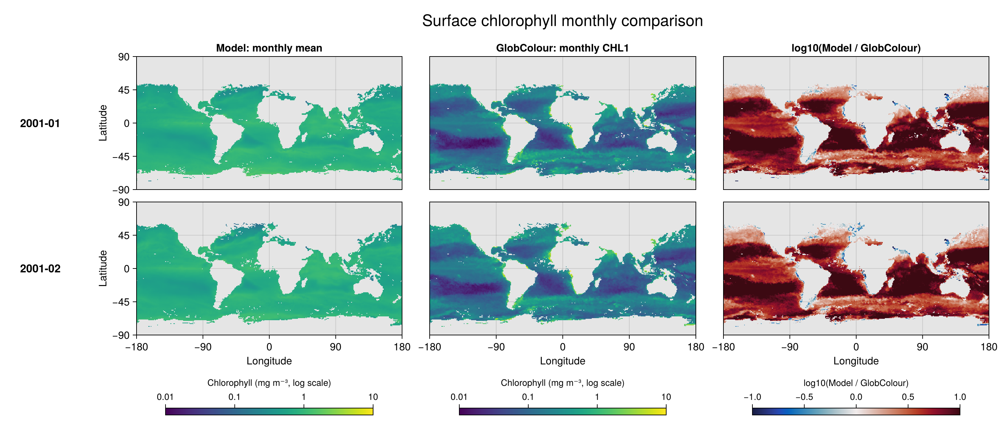

In [9]:
1 <= map_months_per_page <= 4 || error("Use 1 to 4 map months per page.")
save_figures && mkpath(figure_dir)
Base.invokelatest() do
    ordered = sort(results; by=r -> r.satellite.month)
    for (page, start) in enumerate(1:map_months_per_page:length(ordered))
        subset = ordered[start:min(start + map_months_per_page - 1, length(ordered))]
        fig = ChlPlots.monthly_maps(subset; concentration_limits=chl_limits,
                                   ratio_limits=log_ratio_limits)
        display(fig)
        if save_figures
            first_label = Dates.format(first(subset).satellite.month, dateformat"yyyymm")
            last_label = Dates.format(last(subset).satellite.month, dateformat"yyyymm")
            save(joinpath(figure_dir, "chl_maps_page$(lpad(page, 2, '0'))_$(first_label)_$(last_label).png"), fig)
        end
    end
end


## 4. Scatter and monthly means

The scatter shows all months, with dates in the legend. Both axes run up to $100\ \mathrm{mg\,Chl\,m^{-3}}$. Dots are not area weighted.

Monthly means use the shared valid area for each month, so coverage can change. Missing months remain gaps. Satellite sampling differs from the model's daily coverage; a year of spin-up does not by itself show equilibrium.


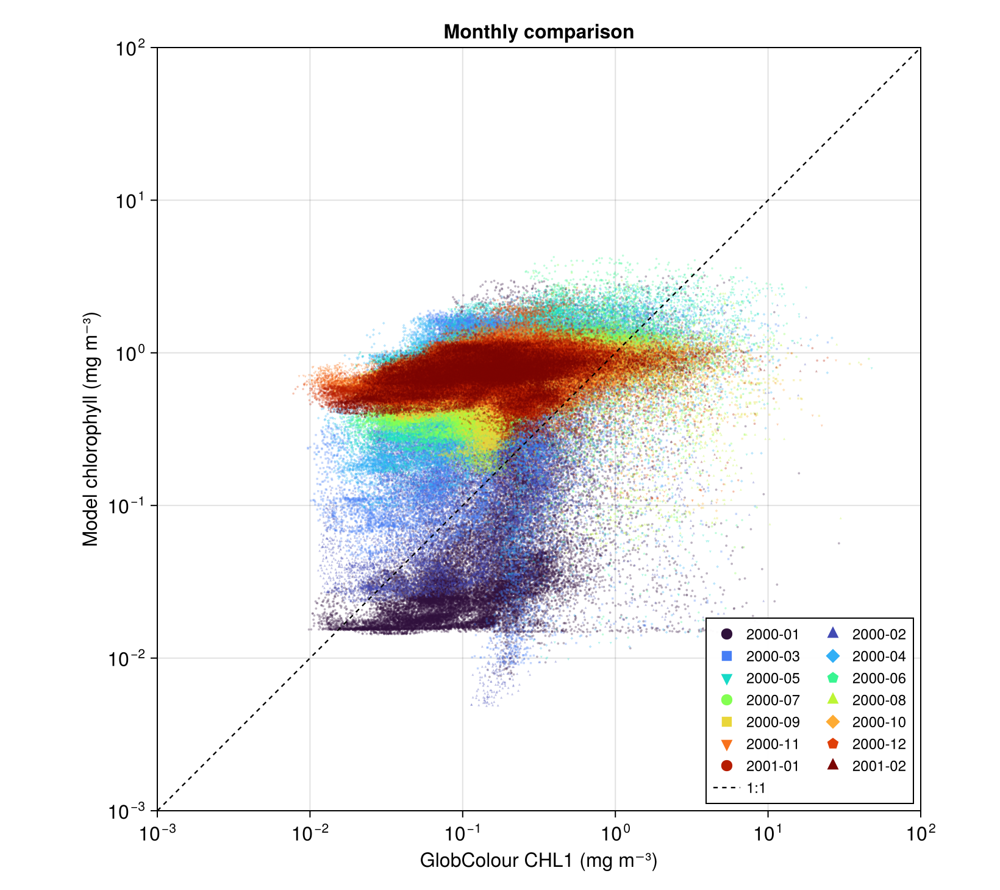

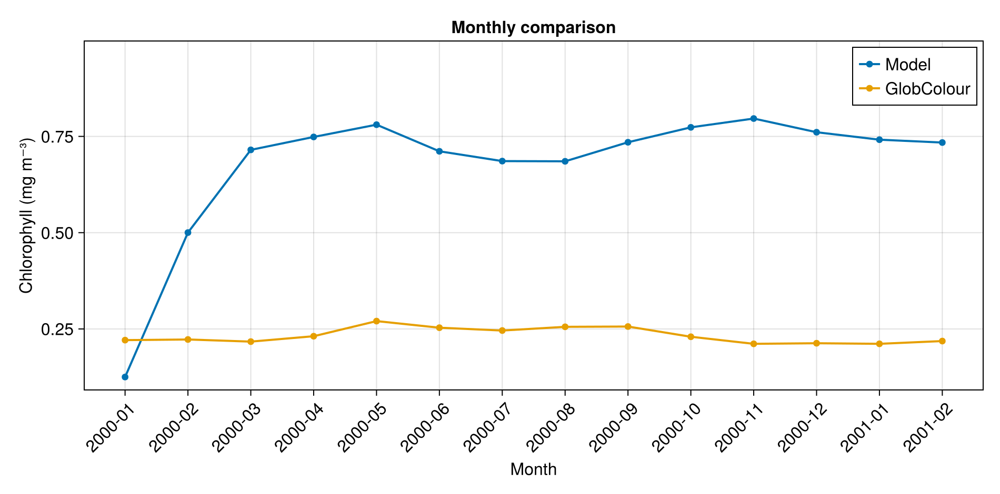

In [10]:
Base.invokelatest() do
    scatter_fig = ChlPlots.scatter_comparison(results; split_months=false, y_max=scatter_axis_max)
    means_fig = ChlPlots.monthly_series(results)
    display(scatter_fig)
    display(means_fig)
    if save_figures
        mkpath(figure_dir)
        save(joinpath(figure_dir, "chl_scatter_all_months.png"), scatter_fig)
        save(joinpath(figure_dir, "chl_monthly_means.png"), means_fig)
    end
end


## 5. Save results

Figures, monthly statistics and file details go to `figure_dir`. Use a new folder to keep an earlier comparison.


In [ ]:
if save_figures
    mkpath(figure_dir)
    Base.invokelatest() do
        ChlComparison.write_catalog(figure_dir, catalog)
    end
    open(joinpath(figure_dir, "comparison_provenance.txt"), "w") do io
        println(io, "Model day 0: ", day0)
        println(io, "Run order (oldest first): ", join(run_names, " -> "))
        println(io, "Duplicate policy: later complete paired snapshot wins; original files unchanged.")
        println(io, "Unique accepted snapshots: ", length(catalog.records))
        println(io, "Actual saved coverage: ", first(catalog.records).datetime, " -> ", last(catalog.records).datetime)
        for (name, paths) in zip(run_names, segment_files)
            println(io, "\nSegment: ", name)
            foreach(p -> println(io, "  ", p), paths)
        end
        println(io, "\nSatellite product / resolution: ", satellite_product, " / ", satellite_resolution)
        println(io, "Missing satellite months: ", join(string.(missing_satellite_months), ", "))
        println(io, "Incomplete model months: ", join(string.([p.month for p in month_plans if !p.complete]), ", "))
        for r in results
            println(io, r.satellite.month, " | ", r.satellite.path, " | file units: ", r.satellite.metadata.original_units)
        end
    end
    open(joinpath(figure_dir, "monthly_statistics.csv"), "w") do io
        println(io, "month,common_cells,satellite_area_covered,model_mean_mg_m3,satellite_mean_mg_m3,bias_mg_m3,rmse_mg_m3,log10_rmse,geometric_model_sat_ratio,model_nonpositive")
        for r in summary_rows
            println(io, join((r.month, r.n, r.observation_area_covered, r.mean_model, r.mean_sat,
                             r.bias, r.rmse, r.log10_rmse, r.geometric_model_sat_ratio, r.n_model_nonpositive), ','))
        end
    end
    println("Saved figures and comparison metadata to: ", figure_dir)
end
